# WCT Signal Extraction
---

In [1]:
%%time
import glob, datetime, warnings, utm, mcaap, sys
sys.path.append('/Users/mronacgiannone/Documents/Cardinal')
import cardinal
#-----------------------------------------------------------------------------------------------------------------#
# Command to make all plots interactive
%matplotlib ipympl

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from obspy import *
from obspy.core import *
from scipy import signal
from pyproj import Geod; g = Geod(ellps='sphere')

warnings.filterwarnings('ignore')

# Global variables where data are stored
WCT_dir = '/Volumes/Extreme SSD/McAAP/Summer_2021/'

CPU times: user 3.15 s, sys: 5.28 s, total: 8.43 s
Wall time: 4.36 s


## WCT Array Processing
---

In [2]:
# Constructing frequency bands for Cardinal
f_bands = cardinal.make_custom_fbands(f_min=1, f_max=20.5, win_max=5, type='third_octave')
f_bands['fmax'].values[-1] = np.round(f_bands['fmax'].values[-1],0) # rounding so f_max becomes Nyquist
f_bands

,band,fmin,fcenter,fmax,win,step
0,1.0,1.000000,1.129961,1.259921,4.758177,0.475818
1,2.0,1.259921,1.423661,1.587401,4.374307,0.437431
2,3.0,1.587401,1.793701,2.000000,4.069629,0.406963
3,4.0,2.000000,2.259921,2.519842,3.827806,0.382781
4,5.0,2.519842,2.847322,3.174802,3.635872,0.363587
5,6.0,3.174802,3.587401,4.000000,3.483533,0.348353
6,7.0,4.000000,4.519842,5.039684,3.362621,0.336262
7,8.0,5.039684,5.694644,6.349604,3.266654,0.326665
8,9.0,6.349604,7.174802,8.000000,3.190484,0.319048
9,10.0,8.000000,9.039684,10.079368,3.130029,0.313003


CPU times: user 3min 17s, sys: 44.5 s, total: 4min 1s
Wall time: 14min 9s


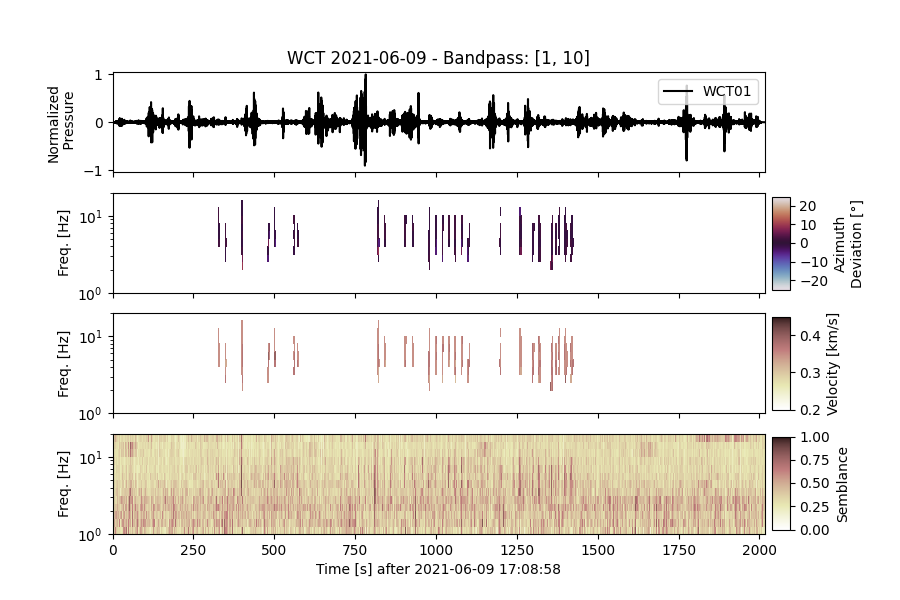

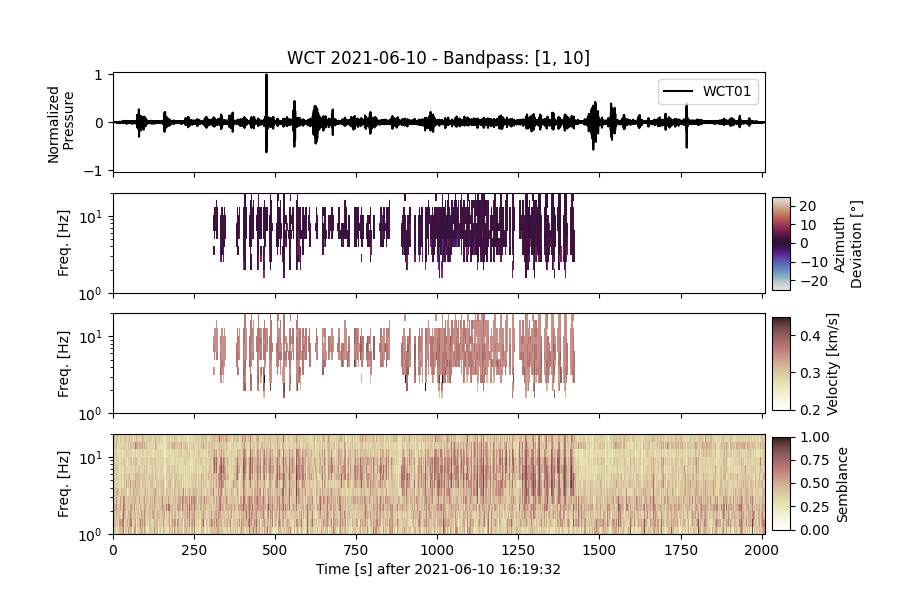

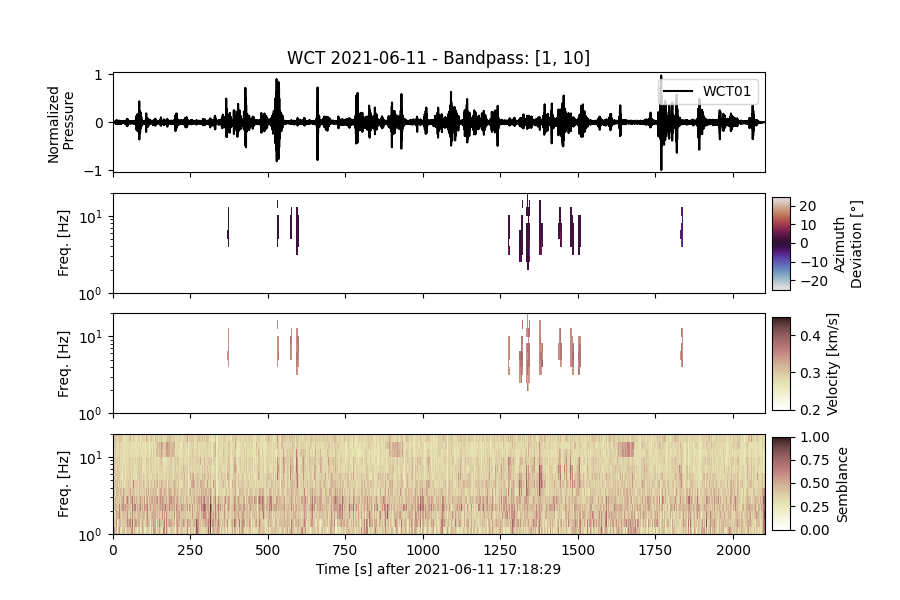

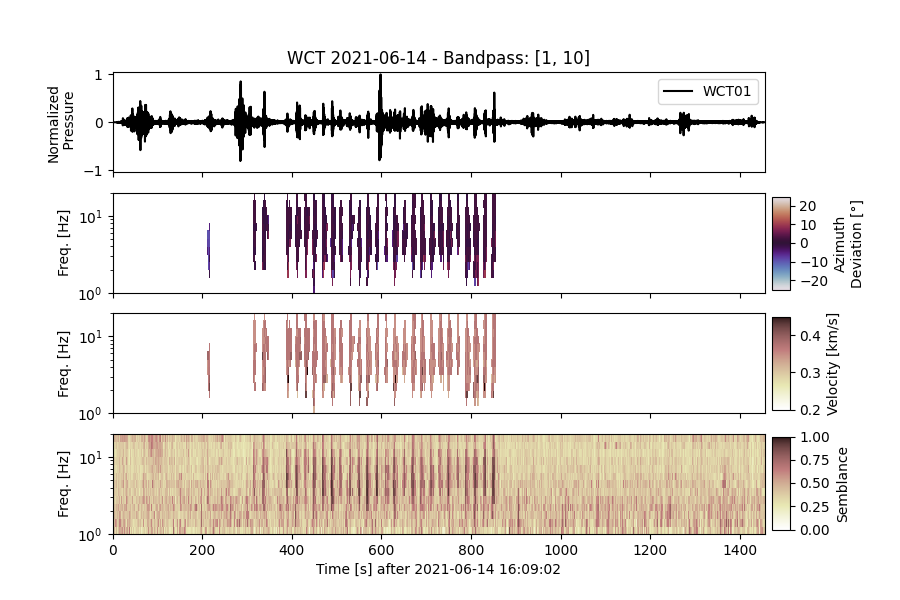

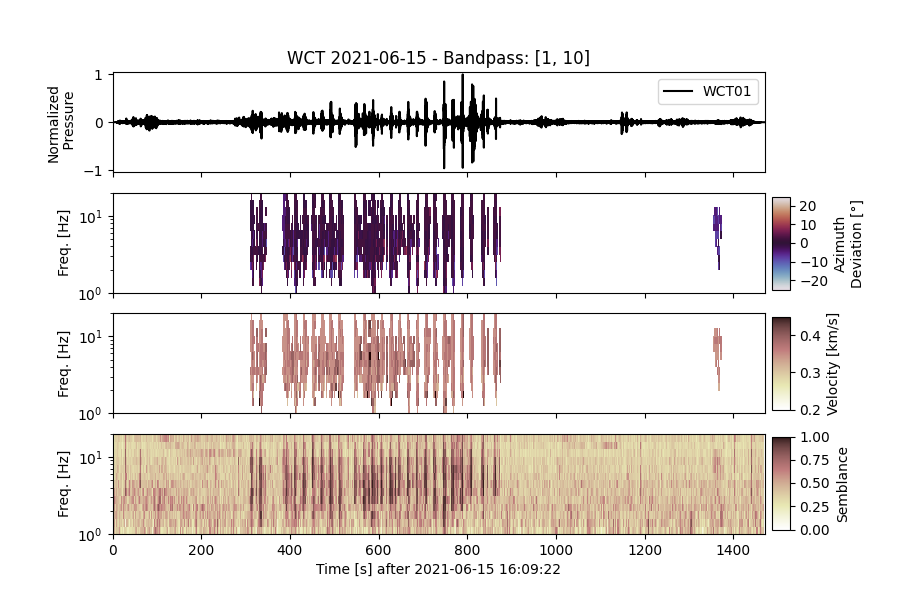

...

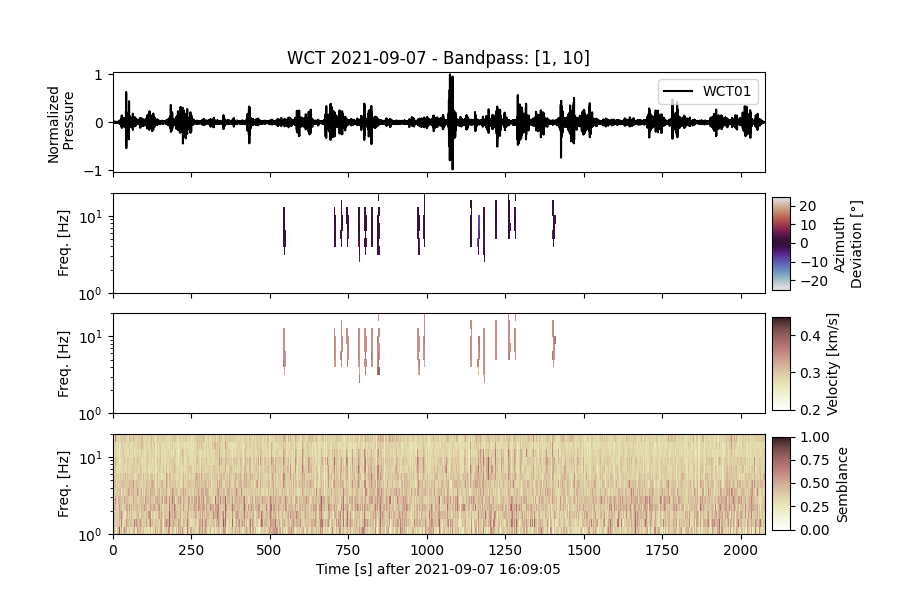

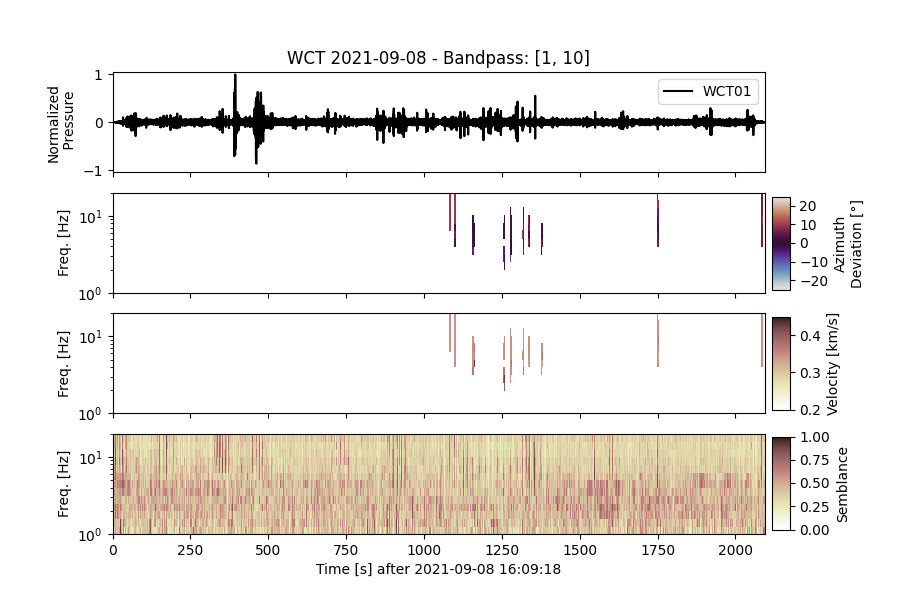

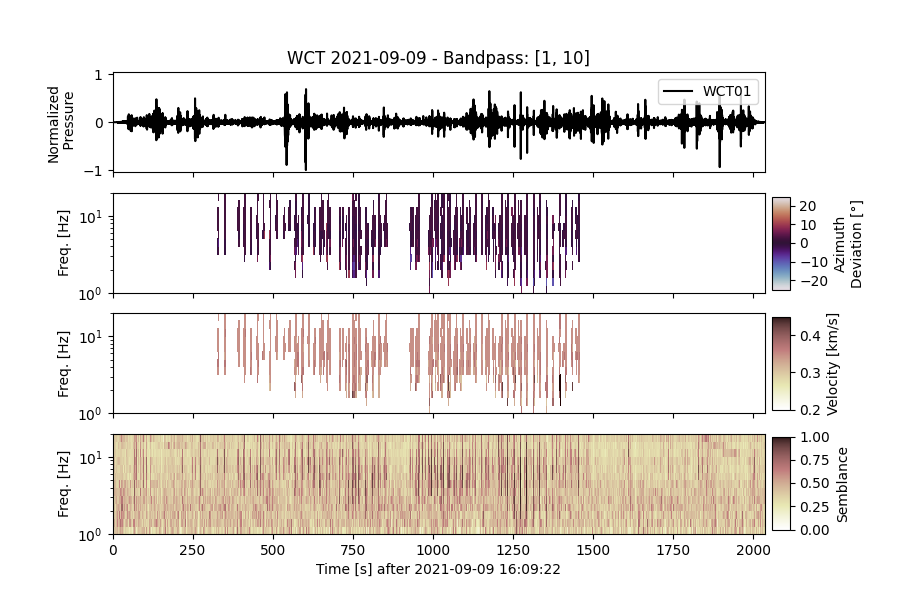

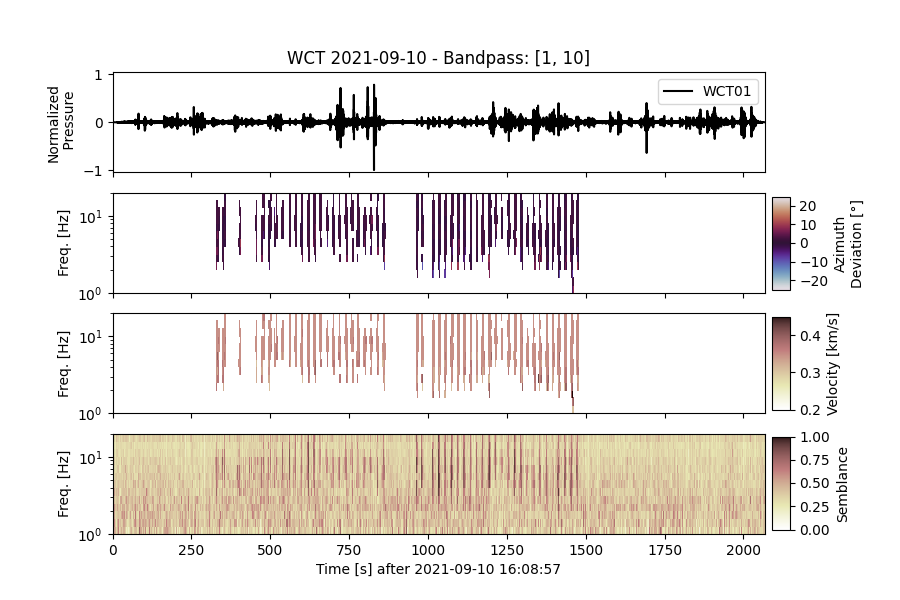

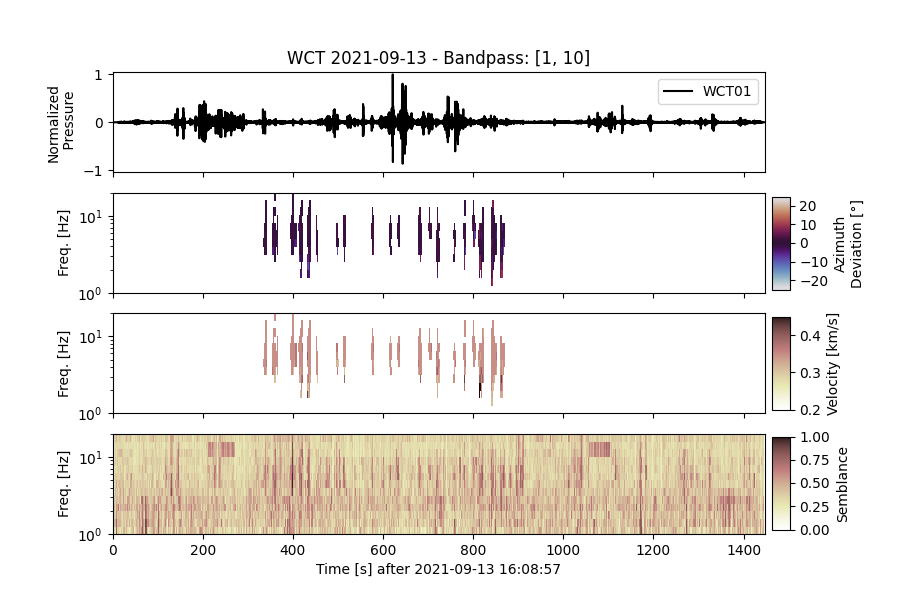

In [3]:
%%time
from dask.distributed import Client
n_workers = 4; client = Client(threads_per_worker=1, n_workers=n_workers, memory_limit='3GB')
# Directory path to verified MCB detections
file_pattern = WCT_dir+'/MCB_Detections/Data/*.mseed'
# Geographic coordinates used for source and MCB array 
source_lon = -95.902050; source_lat = 34.802819; MCB_lon = -95.874884; MCB_lat = 34.832434
# Loop through each file and process WCT array data
for MCB_filepath in glob.glob(file_pattern):
    st = Stream()
    day = MCB_filepath.split('/')[-1].split('_')[-1].split('.')[0]
    if day == str(159): continue
    #-----------------------------------------------------------------------------------------------------------------------#
    # Read data
    st = mcaap.read_data(day=day, data_dir=WCT_dir, loc_dir=WCT_dir+'WCT_BDF_Locations.txt', WCT=True)
    #-----------------------------------------------------------------------------------------------------------------------#
    # Calculating GT back azimuth for filtering array processing results
    _, GT_baz, _ = g.inv(source_lon, source_lat, st[0].stats.sac.stlo, st[0].stats.sac.stla) # using midpoint between areas 1 and 2
    if GT_baz < 0: GT_baz += 360
    #-----------------------------------------------------------------------------------------------------------------------#
    # Load MCB start times
    with open(WCT_dir+'MCB_Detections/Signal_Times_CWT/UTC_Starttimes/'+str(day)+'.txt', 'r') as f: # reference time (UTC)
        ref_time = UTCDateTime(f.read())
    with open(WCT_dir+'MCB_Detections/Signal_Times_CWT/MCB01_BDF/'+str(day)+'.npy', 'rb') as f: # only using central array element
        MCB_times = np.load(f)
    #-----------------------------------------------------------------------------------------------------------------------#
    # Calculate buffers for WCT trim
    MCB_startTime = ref_time + MCB_times[0][0]; MCB_endTime = ref_time + MCB_times[0][-1] # onset of first/last signal at MCB center element
    _, _, dist = g.inv(MCB_lon, MCB_lat, st[0].stats.sac.stlo, st[0].stats.sac.stla); dist /= 1000 # distance b/w MCB and WCT - converted to km
    start_buffer = dist / 0.500; end_buffer = dist / 0.180 # buffer using celerity
    startTrim = MCB_startTime + start_buffer; endTrim = MCB_endTime + end_buffer
    #-----------------------------------------------------------------------------------------------------------------------#
    # Trim and save stream
    st.trim(startTrim, endTrim)
    try:
        st.write(WCT_dir+'WCT_Detections/Data/WCT_'+str(day)+'.mseed', format='MSEED')
    except:
        st = st.split().copy()
        st.write(WCT_dir+'WCT_Detections/Data/WCT_'+str(day)+'.mseed', format='MSEED')
    #-----------------------------------------------------------------------------------------------------------------------#
    # Run Cardinal
    T, B, V, S = cardinal.sliding_time_array_fk_multifreq(st, f_bands, client, adaptive_array=False)
    #-----------------------------------------------------------------------------------------------------------------#
    # Creating families
    ref_time = st[0].stats.starttime.matplotlib_date
    ix, pixels_in_families, families = cardinal.make_families(T, B, V, S, f_bands, ref_time,
                                                                 dist_threshold=1, min_pixels=25,
                                                                 sigma_b=10, sigma_f=2, sigma_t=2, semblance_threshold=0.5,
                                                                 GT_baz=GT_baz, baz_dev=10, expected_vel=0.4, vel_dev=0.1, family_grouping='kdtree')
#     df = cardinal_v3.df_families(ref_time, families)
#     df.to_csv(WCT_dir+'WCT_Detections/Cardinal_Families/'+str(day)+'.csv', index=False)
    #-----------------------------------------------------------------------------------------------------------------#
    # Plot results
    cardinal.plot_sliding_window_multifreq(st, f_bands, T, B, V, S, clim_vtr=[0.2,0.45], clim_baz=[-25,25],amp_units='Pressure [Pa]', normalize=True, bandpass=[1,10], GT_baz=GT_baz, figsize=(9,6), 
                                           ix=ix, pixels_in_families=pixels_in_families, 
                                           title='WCT ' + str(st[0].stats.starttime).split('T')[0], fname_plot=WCT_dir+'WCT_Detections/Cardinal_Plots/'+str(day)+'.png')

---
#### Beamforming Stratospheric Detections and Extracting Signal Times

In [13]:
%%time
# Loop through each file and store Julian day of each detection
file_pattern = WCT_dir+'/MCB_Detections/Data/*.mseed'
dets_julian_days = []
for MCB_filepath in glob.glob(file_pattern):
    st = Stream()
    day = MCB_filepath.split('/')[-1].split('_')[-1].split('.')[0]
    dets_julian_days.append(day)

CPU times: user 1.29 ms, sys: 2.67 ms, total: 3.96 ms
Wall time: 3.86 ms


CPU times: user 5.52 s, sys: 30.3 ms, total: 5.55 s
Wall time: 5.46 s


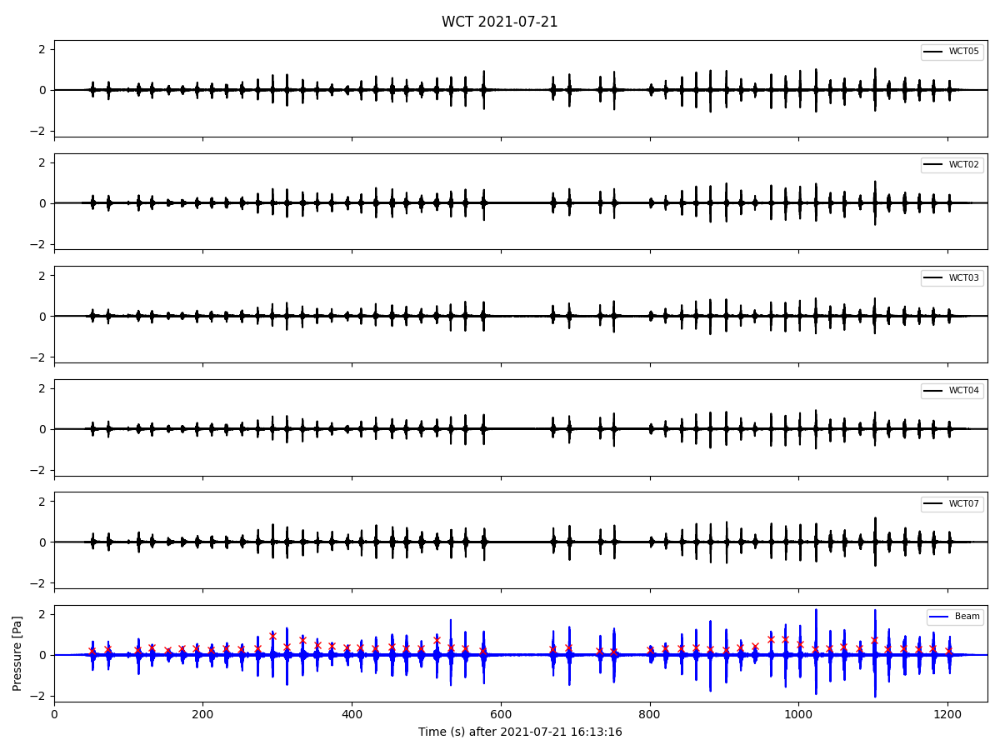

In [15]:
%%time
mcaap.get_signal_times_cwt(day_idx=28, dets_julian_days=dets_julian_days, trim_from_start=250, trim_from_end=575, legend_loc='upper right', legend_size=7.5, WCT=True, vel=0.35, normalize=False,
                           scales=[0.1,0.2,0.3,0.4,0.5], min_snr=5, min_distance_secs=17.5, freqmin=5, freqmax=10, find_peaks=True, save=False, figsize=(12,9), 
                           remove_stations=['WCT01'])